## 모델 준비하기

In [1]:
# Diffusers 설치
!pip install qq diffusers==0.31

In [2]:
import torch 
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)


===================================BUG REPORT===================================
Welcome to bitsandbytes. For bug reports, please run

python -m bitsandbytes

 and submit this information together with your error trace to: https://github.com/TimDettmers/bitsandbytes/issues
bin /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so
/opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so: undefined symbol: cadam32bit_grad_fp32
CUDA_SETUP: WARNING! libcudart.so not found in any environmental path. Searching in backup paths...
CUDA SETUP: Highest compute capability among GPUs detected: 7.5
CUDA SETUP: Detected CUDA version 113
CUDA SETUP: Loading binary /opt/conda/lib/python3.9/site-packages/bitsandbytes/libbitsandbytes_cpu.so...


/opt/conda/lib/python3.9/site-packages/bitsandbytes/cextension.py:34: UserWarning: The installed version of bitsandbytes was compiled without GPU support. 8-bit optimizers, 8-bit multiplication, and GPU quantization are unavailable.
  warn("The installed version of bitsandbytes was compiled without GPU support. "
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('/usr/local/nvidia/lib')}
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: /usr/local/nvidia/lib:/usr/local/nvidia/lib64 did not contain ['libcudart.so', 'libcudart.so.11.0', 'libcudart.so.12.0'] as expected! Searching further paths...
  warn(msg)
/opt/conda/lib/python3.9/site-packages/bitsandbytes/cuda_setup/main.py:149: UserWarning: WARNING: The following directories listed in your path were found to be non-existent: {PosixPath('tcp'), Posix

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

## Text-to-Image Generation

In [3]:
import torch 
from diffusers import DiffusionPipeline, DPMSolverMultistepScheduler

device = "cuda"

# 파이프라인 불러오기
repo_id = "stabilityai/stable-diffusion-2-base"
pipe = DiffusionPipeline.from_pretrained(repo_id, torch_dtype=torch.float16)

pipe.scheduler = DPMSolverMultistepScheduler.from_config(pipe.scheduler.config)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

### 하나의 이미지 생성하기

In [4]:
prompt = str(input('prompt: '))  # 프롬프트를 영어로 입력해보세요

prompt: Penguins in the Arctic


  0%|          | 0/25 [00:00<?, ?it/s]

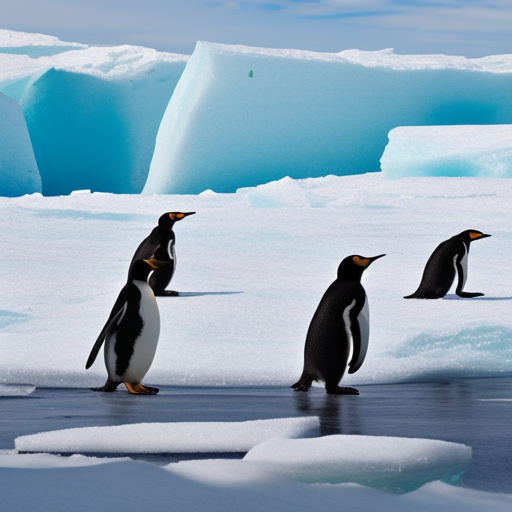

In [5]:
# 이미지 저장 폴더 만들기   
import os
# os.mkdir("/aiffel/aiffel/diffusers")    # diffusers 폴더를 이미 만들었다면 주석 처리해 주세요.

# 입력한 프롬프트를 사용하여 이미지 생성 
image = pipe(prompt, num_inference_steps=25).images[0]

# 이미지 저장
image.save("/aiffel/aiffel/diffusers/image.png")  

# 이미지 출력 
image

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


  0%|          | 0/75 [00:00<?, ?it/s]

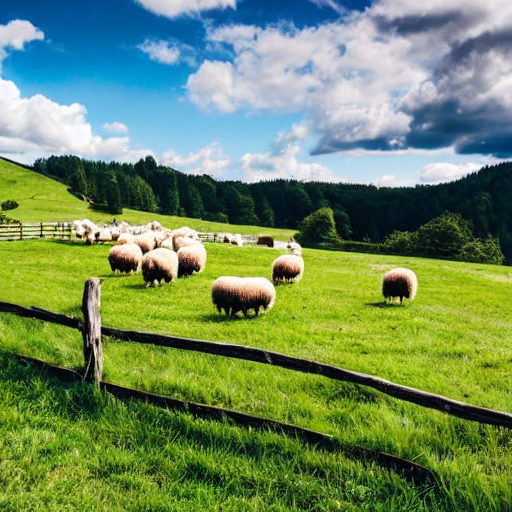

In [6]:
from diffusers import StableDiffusionPipeline
import torch

# Load the model
model_id = "runwayml/stable-diffusion-v1-5"
pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe.to("cuda")  # Use GPU for faster generation

# Define your custom prompt
prompt = "A wide green meadow with fluffy white sheep grazing peacefully under a blue sky with soft clouds. Rolling hills and a wooden fence in the background."

# Set hyperparameters
height = 512  # Image height (multiple of 8)
width = 512   # Image width (multiple of 8)
num_inference_steps = 75  # Increase for higher quality
guidance_scale = 8.0  # Higher values make the image stick closely to the prompt

# Generate the image
image = pipe(prompt, height=height, width=width, num_inference_steps=num_inference_steps, guidance_scale=guidance_scale).images[0]

# Save and display the image
image.save("image_2.png")
image.show()

### 여러 개의 이미지 생성하기

In [7]:
# 파이썬 이미지 처리 라이브러리 pillow 불러오기 
from PIL import Image  

# 틀 만들기
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows * cols

    w, h = imgs[0].size  
    grid = Image.new('RGB', size=(cols * w, rows * h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        grid.paste(img, box = (i%cols * w, i // cols * h))
    return grid

  0%|          | 0/50 [00:00<?, ?it/s]

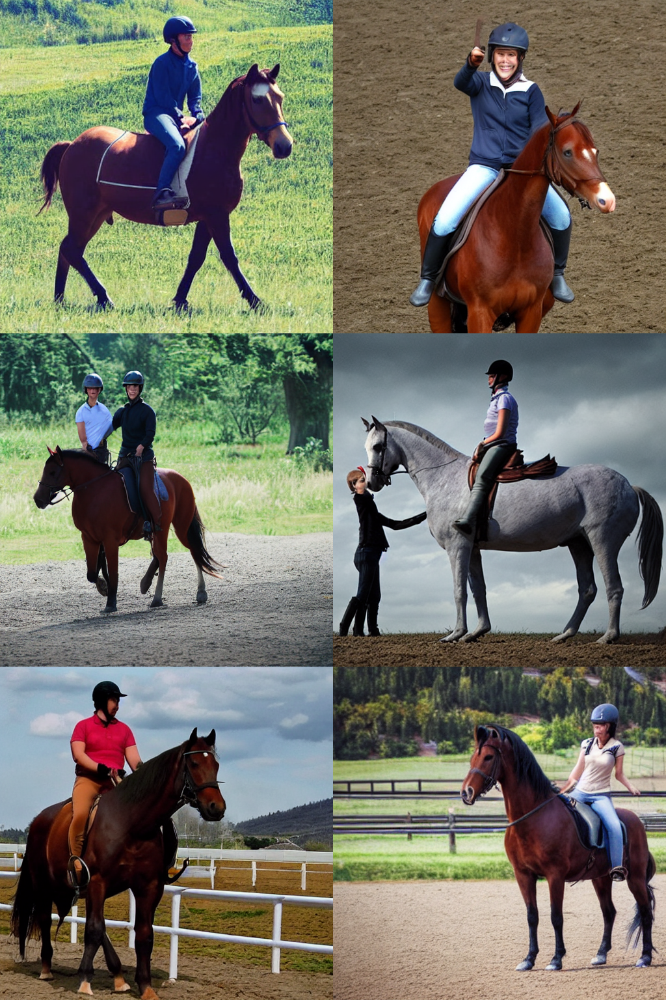

In [8]:
# 이미지의 개수 
num_images = 6

# 프롬프트 입력
prompt = ['a horse riding a person'] * num_images

# 이미지 생성
images = pipe(prompt).images

# 이미지 출력
grid = image_grid(images, rows= 3, cols= 2)
grid

  0%|          | 0/50 [00:00<?, ?it/s]

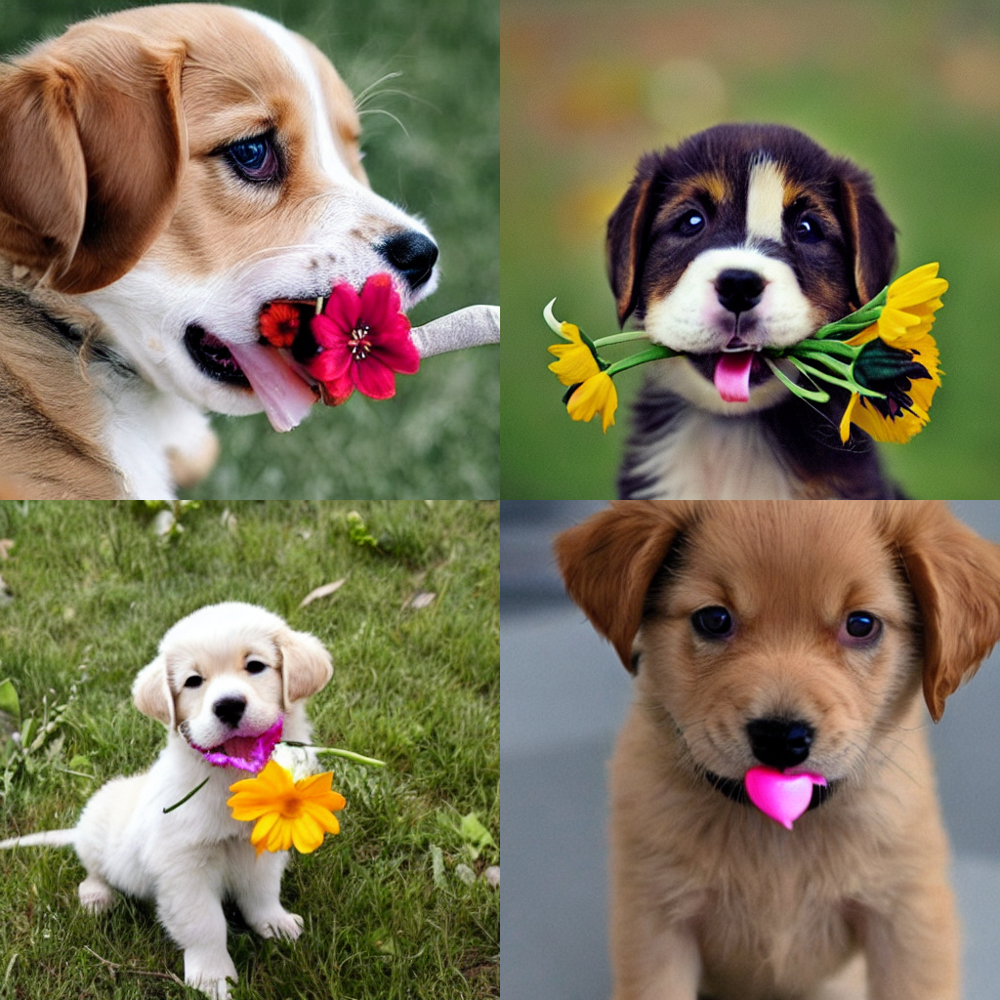

In [9]:
# 이미지의 개수 
num_images = 4

# 프롬프트 입력
prompt = ['A cute puppy holding a flower in its mouth'] * num_images

# 이미지 생성
images = pipe(prompt).images

# 이미지 출력
grid = image_grid(images, rows= 2, cols= 2)
grid

In [10]:
# GPU 메모리를 지우는 코드입니다. 
torch.cuda.empty_cache()

## Image-to-Image Generation

In [11]:
# Image-to-Image Generation 파이프라인 불러오기    
from diffusers import StableDiffusionImg2ImgPipeline

device = "cuda"
model_path = "CompVis/stable-diffusion-v1-4"

pipe = StableDiffusionImg2ImgPipeline.from_pretrained(
    model_path,
    torch_dtype=torch.float16,
)
pipe = pipe.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


### 하나의 이미지 생성하기

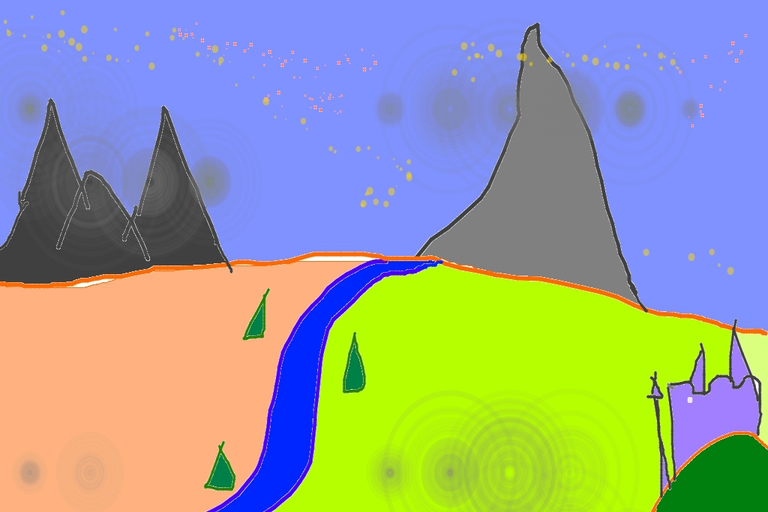

In [12]:
import requests  
from io import BytesIO

url = "https://raw.githubusercontent.com/CompVis/stable-diffusion/main/assets/stable-samples/img2img/sketch-mountains-input.jpg"

# url 호출하기
response = requests.get(url)

# 이미지 열기
init_img = Image.open(BytesIO(response.content)).convert("RGB")  # 이미지를 메모리로 읽어와서 RGB로 변경합니다. 
init_img = init_img.resize((768, 512))  # 이미지의 크기를 조절합니다. 
init_img

In [13]:
prompt = "A fantasy landscape, trending on artstation"

  0%|          | 0/37 [00:00<?, ?it/s]

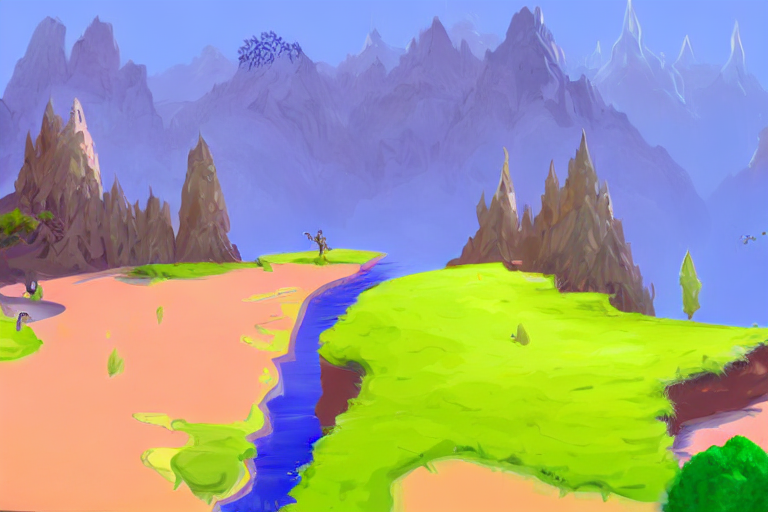

In [14]:
generator = torch.Generator(device=device).manual_seed(1024)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/aiffel/aiffel/diffusers/fantasy_landscape.png")
images[0]

### 여러 개의 이미지 생성하기

/opt/conda/lib/python3.9/site-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion_img2img.py:768: FutureWarning: You have passed 2 text prompts (`prompt`), but only 1 initial images (`image`). Initial images are now duplicating to match the number of text prompts. Note that this behavior is deprecated and will be removed in a version 1.0.0. Please make sure to update your script to pass as many initial images as text prompts to suppress this warning.
  deprecate("len(prompt) != len(image)", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/45 [00:00<?, ?it/s]

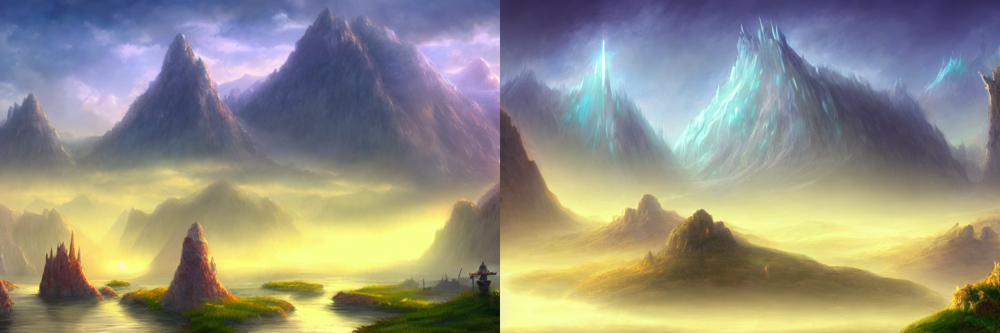

In [15]:
num_images = 2

# 프롬프트 입력
prompt = ['A fantasy landscape, trending on artstation'] * num_images

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1025)
images = pipe(prompt=prompt, image=init_img, strength=0.9, guidance_scale=13.5, num_inference_steps=50, generator=generator).images
images

# 이미지 출력
grid = image_grid(images, rows=1, cols=2)
grid

  0%|          | 0/35 [00:00<?, ?it/s]

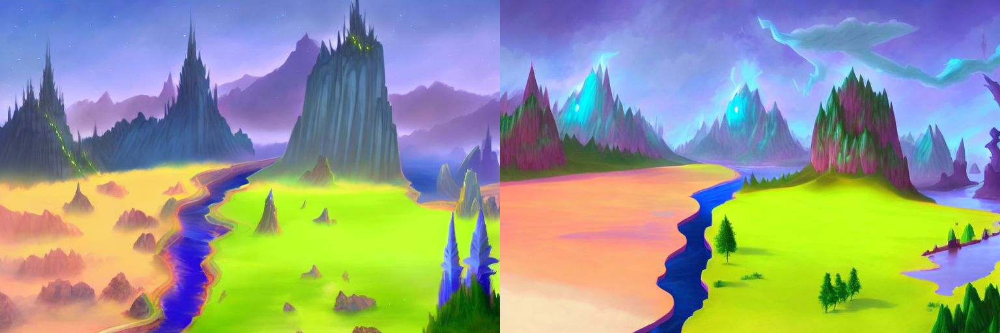

In [16]:
# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1026)
images = pipe(prompt=prompt, image=init_img, strength=0.7, guidance_scale=20.5, num_inference_steps=50, generator=generator).images
images

# 이미지 출력
grid = image_grid(images, rows=1, cols=2)
grid

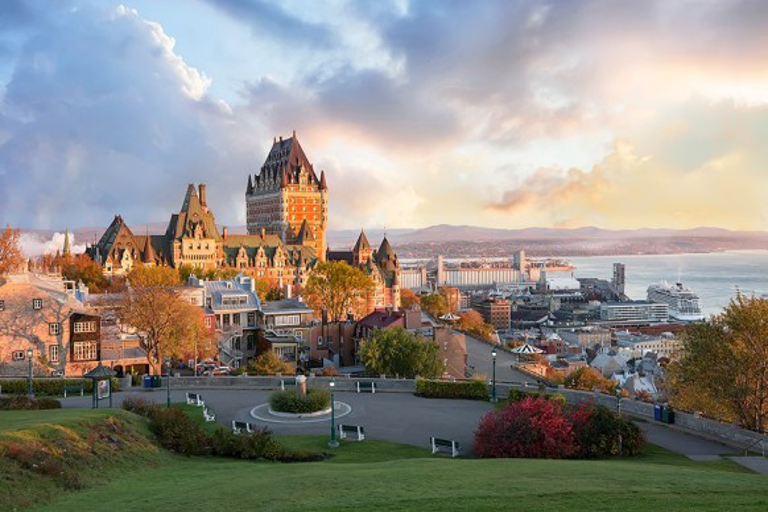

In [31]:
# 이미지 열기
init_img = Image.open("/aiffel/aiffel/diffusers/quebec_image.jpg", mode = 'r')
init_img = init_img.resize((768, 512)) 
init_img

  0%|          | 0/27 [00:00<?, ?it/s]

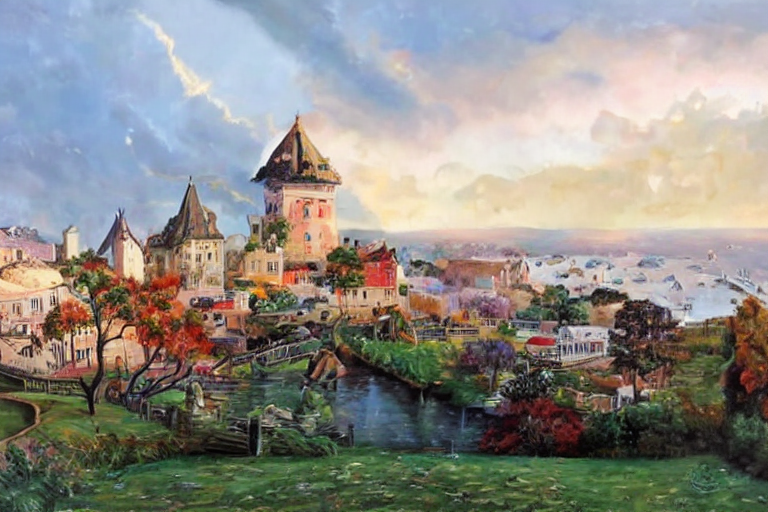

In [32]:
# 원하는 스타일의 프롬프트 작성
prompt = "Painting"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1027)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.55, guidance_scale=5.5).images
images[0].save("/aiffel/aiffel/diffusers/painting_quebec.png")
images[0]

  0%|          | 0/27 [00:00<?, ?it/s]

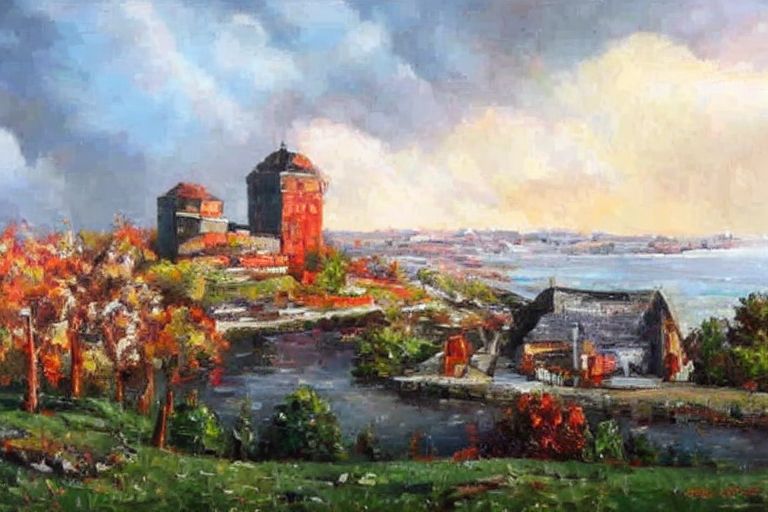

In [34]:
# 원하는 스타일의 프롬프트 작성
prompt = "Oil painting"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1028)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.55, guidance_scale=7.5).images
images[0].save("/aiffel/aiffel/diffusers/painting_quebec.png")
images[0]

  0%|          | 0/37 [00:00<?, ?it/s]

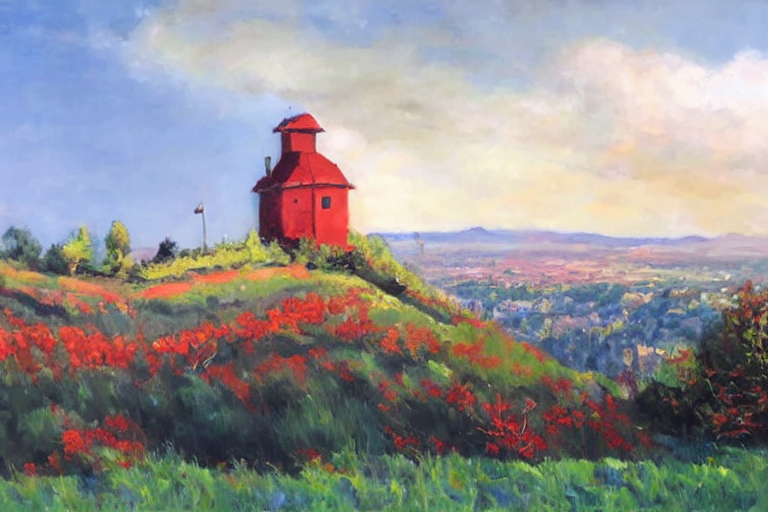

In [35]:
# 원하는 스타일의 프롬프트 작성
prompt = "Oil painting"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1029)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/aiffel/aiffel/diffusers/painting_quebec.png")
images[0]

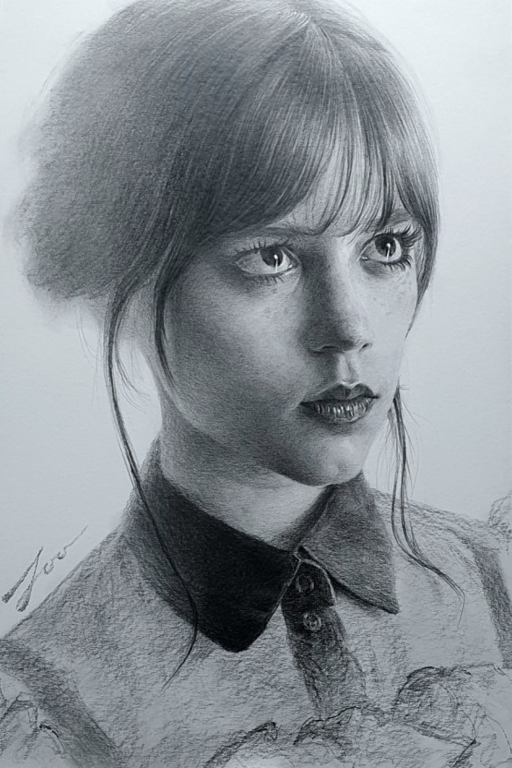

In [53]:
# 이미지 열기
init_img = Image.open("/aiffel/aiffel/diffusers/Jenna_image.png", mode = 'r')
init_img = init_img.resize((512, 768)) 
init_img

  0%|          | 0/27 [00:00<?, ?it/s]

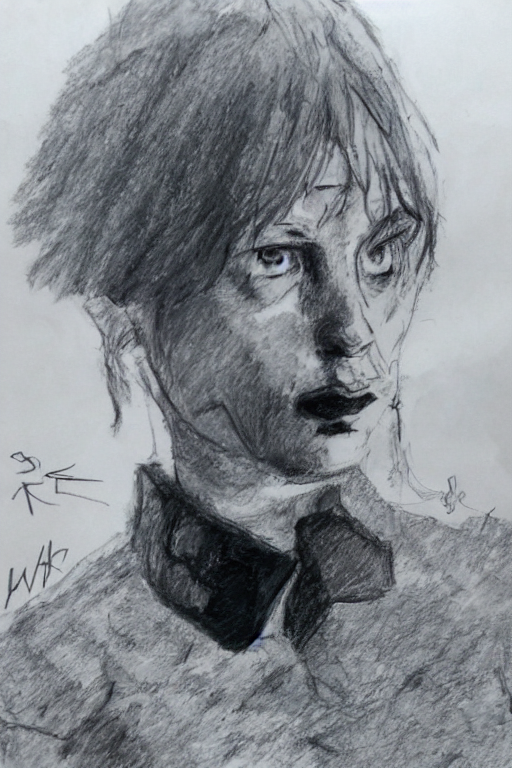

In [54]:
# 원하는 스타일의 프롬프트 작성
prompt = "Colorized version of a sketch"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1030)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.55, guidance_scale=5.5).images
images[0].save("/aiffel/aiffel/diffusers/colorized_Jenna.png")
images[0]

  0%|          | 0/37 [00:00<?, ?it/s]

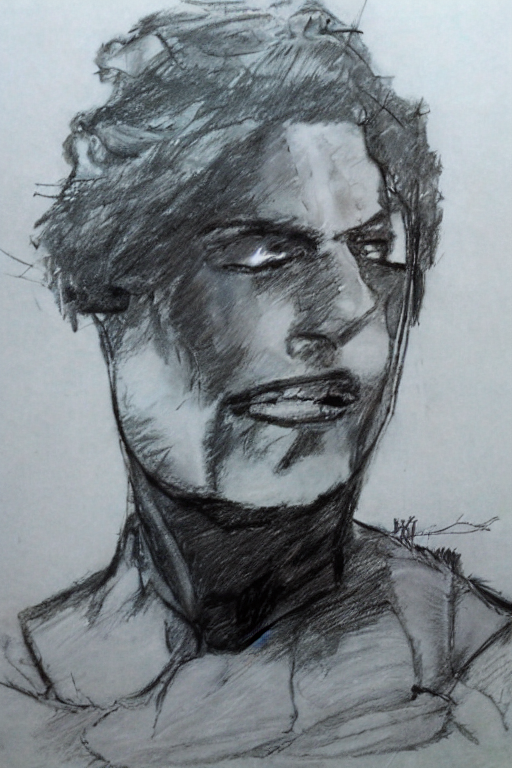

In [55]:
# 원하는 스타일의 프롬프트 작성
prompt = "Colorized version of a sketch"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1031)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=5.5).images
images[0].save("/aiffel/aiffel/diffusers/colorized_Jenna.png")
images[0]

  0%|          | 0/37 [00:00<?, ?it/s]

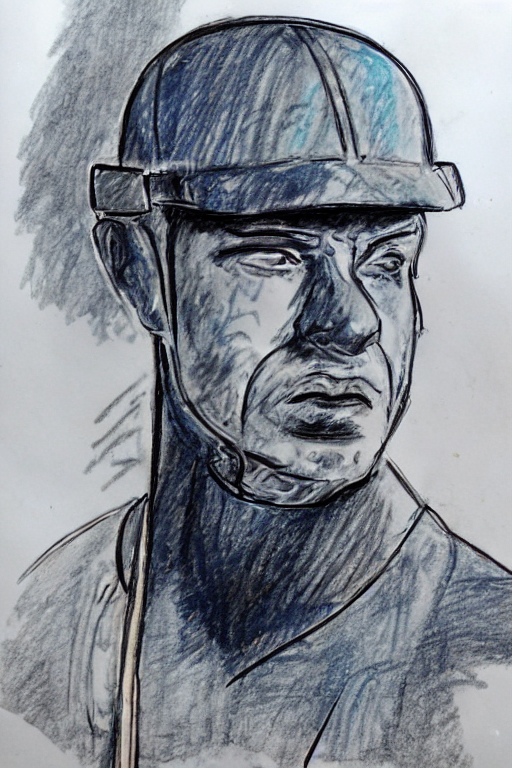

In [56]:
# 원하는 스타일의 프롬프트 작성
prompt = "Colorized version of a sketch"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1032)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/aiffel/aiffel/diffusers/colorized_Jenna.png")
images[0]

  0%|          | 0/37 [00:00<?, ?it/s]

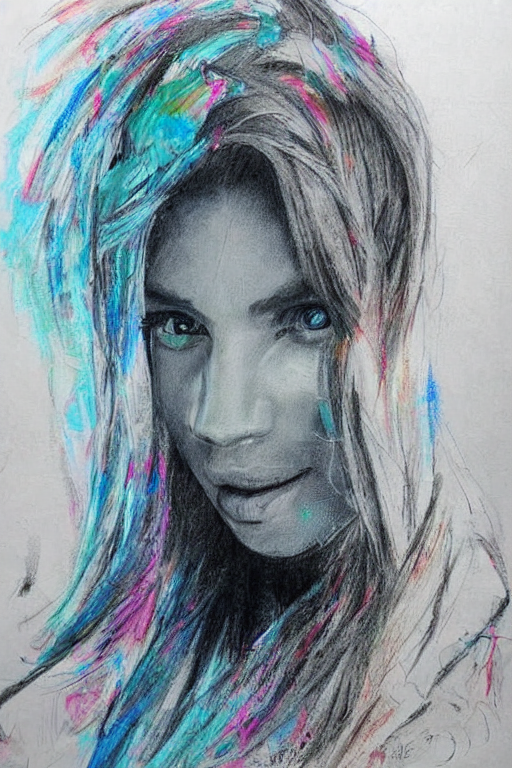

In [57]:
# 원하는 스타일의 프롬프트 작성
prompt = "painting of a sketch, vibrant colors, realistic"

# 이미지 생성
generator = torch.Generator(device=device).manual_seed(1033)   # 모델을 사용할 때마다 동일한 이미지를 생성하기 위해 seed를 설정합니다.  

images = pipe(prompt=prompt, image=init_img, strength=0.75, guidance_scale=7.5).images
images[0].save("/aiffel/aiffel/diffusers/colorized_Jenna.png")
images[0]